#### Import numpy, matplotlib.pyplot and make it inline

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
from sklearn.metrics import r2_score
%matplotlib inline

#### Functions

In [2]:
def Loss_Epochs_plot(X, Y, xlabel, ylabel):
    fig = plt.figure()
    plt.plot(X, Y, marker = 'o')
    plt.grid(linewidth = 0.3)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(f"{ylabel} Vs. {xlabel}")
    
def regression_lines_plot(X, Y, xlabel, ylabel):
    plt.plot(X, Y, 'r')
    plt.grid(linewidth = 0.3)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(f"{ylabel} Vs. {xlabel}")
    
def training_report(a , b, c, d, e, f, g):
    print("\n****************** Training Report ********************\n")
    print(f"Gradient Descent converged after {int(a)} epochs")
    print(f"\ntheta_0_Opt : {b}\ntheta_1_Opt : {c}")
    print("\nError Vector:\n", d)
    print("\nCost = ", e)
    print("\nh(x) = y_predict:\n", f)
    print("\ny_actual:\n", g)
    
def all_plots(m, X, Y, Y_pred):
    theta_0 = m[:, 1]
    theta_1 = m[:, 2]

    cost = m[:, 3]
    x = m[:, 0]
    fig = plt.figure()
    Loss_Epochs_plot(x, cost, 'Ephocs', 'Loss')

    Loss_Epochs_plot(theta_0, cost, 'theta_0', "Loss")
    plt.title("Learning Rate = 0.0005")
    Loss_Epochs_plot(theta_1, cost, "theta_1", "Loss")
    plt.title("Learning Rate = 0.0005")

    fig = plt.figure()
    plt.plot(X, Y, 'ob')
    for i in Y_pred:
        regression_lines_plot(X, i, "x", "y")
    
    fig = plt.figure()
    plt.plot(X, Y, 'ob', markersize = 4)
    regression_lines_plot(X, Y_pred[-1], "x", "y")

To have a dataset or set of data points, the student must generate a pair of arrays <b>X</b> and <b>y</b> with the values in <b>X</b> equally distributed between <b>0</b> and <b>20</b> and the values in <b>y</b> such that: 
<b>yi = a*xi + b (and a = -1, b = 2)</b>


In [3]:
X = np.linspace(0,20)
X

array([ 0.        ,  0.40816327,  0.81632653,  1.2244898 ,  1.63265306,
        2.04081633,  2.44897959,  2.85714286,  3.26530612,  3.67346939,
        4.08163265,  4.48979592,  4.89795918,  5.30612245,  5.71428571,
        6.12244898,  6.53061224,  6.93877551,  7.34693878,  7.75510204,
        8.16326531,  8.57142857,  8.97959184,  9.3877551 ,  9.79591837,
       10.20408163, 10.6122449 , 11.02040816, 11.42857143, 11.83673469,
       12.24489796, 12.65306122, 13.06122449, 13.46938776, 13.87755102,
       14.28571429, 14.69387755, 15.10204082, 15.51020408, 15.91836735,
       16.32653061, 16.73469388, 17.14285714, 17.55102041, 17.95918367,
       18.36734694, 18.7755102 , 19.18367347, 19.59183673, 20.        ])

In [4]:
a=-1
b=2
y=a*X+b
y

array([  2.        ,   1.59183673,   1.18367347,   0.7755102 ,
         0.36734694,  -0.04081633,  -0.44897959,  -0.85714286,
        -1.26530612,  -1.67346939,  -2.08163265,  -2.48979592,
        -2.89795918,  -3.30612245,  -3.71428571,  -4.12244898,
        -4.53061224,  -4.93877551,  -5.34693878,  -5.75510204,
        -6.16326531,  -6.57142857,  -6.97959184,  -7.3877551 ,
        -7.79591837,  -8.20408163,  -8.6122449 ,  -9.02040816,
        -9.42857143,  -9.83673469, -10.24489796, -10.65306122,
       -11.06122449, -11.46938776, -11.87755102, -12.28571429,
       -12.69387755, -13.10204082, -13.51020408, -13.91836735,
       -14.32653061, -14.73469388, -15.14285714, -15.55102041,
       -15.95918367, -16.36734694, -16.7755102 , -17.18367347,
       -17.59183673, -18.        ])

#### Plot X vs. y

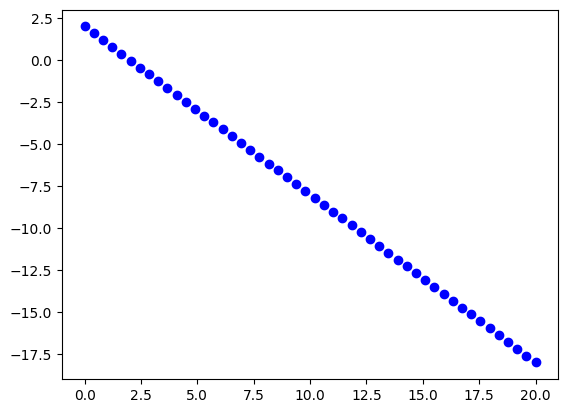

In [5]:
plt.plot(X, y, 'ob')

## Adam

### Update the previos implementation to be Adam.
#### Compare your results with Adagrad and RMSProp results.

In [ ]:
def Adam_single_var(X, Y, LR, epsilon, Beta1, Beta2, Max_iter):
    # step_1
    theta_0 = 0
    theta_1 = 0
    eps = epsilon
    beta1 = Beta1
    beta2 = Beta2
    v_t_0 = 0
    v_t_1 = 0
    m_t_0 = 0
    m_t_1 = 0
    m = len(X)
    Y_pred = []
    Thetas_Cost = []
        
    for i in range(Max_iter):
        print(f"\n****************** Iteration {i} ********************")
    # step_2:
        y_pred = theta_0 + (theta_1*X)
        print("\nh(x):\n", y_pred)
        Y_pred.append(y_pred)
        
    # step_3
        Error = y_pred - Y
        cost = (1/(2*m)) * (Error @ Error)   
        print("\nError Vector:\n", Error)
        print("\nj: ", cost)
        
        Thetas_Cost.append([i, theta_0, theta_1, cost])         # append values of thetas and cost 
    
    # step_4
        d_theta_0 = (1/m) * sum(Error * 1)
        d_theta_1 = (1/m) * sum(Error * X)
        GV = [[d_theta_0], 
             [d_theta_1]]
        GV_norm = np.linalg.norm(GV)
        print("\nGradient Vector:\n", GV)
        print("\nGradient Vector Norm:\n", GV_norm)
        
        if (GV_norm < 0.001) or ((i > 0) and (abs(Thetas_Cost[i][3] - Thetas_Cost[i-1][3])) < 0.001):       # (Gradient Check, convergence check)
            break
    
    # step_5
        m_t_0 = (beta1 * m_t_0) + ((1 - beta1)*(d_theta_0))
        m_t_1 = (beta1 * m_t_1) + ((1 - beta1)*(d_theta_1))
        
        v_t_0 = (beta2 * v_t_0) + ((1 - beta2)*(d_theta_0)**2)
        v_t_1 = (beta2 * v_t_1) + ((1 - beta2)*(d_theta_1)**2)
        
        m_t_0_hat = m_t_0 / (1-((beta1)**(i+1)))
        m_t_1_hat = m_t_1 / (1-((beta1)**(i+1)))
        
        v_t_0_hat = v_t_0 / (1-((beta2)**(i+1)))
        v_t_1_hat = v_t_1 / (1-((beta2)**(i+1)))
        
        theta_0 = theta_0 - ((LR/(np.sqrt(v_t_0_hat) + eps)) * m_t_0_hat)
        theta_1 = theta_1 - ((LR/(np.sqrt(v_t_1_hat) + eps)) * m_t_1_hat)

        print("\nm_t_0: ", m_t_0)
        print("m_t_1: ", m_t_1)
        print("\nm_t_0_corrected: ", m_t_0_hat)
        print("m_t_1_corrected: ", m_t_1_hat)
        print("\nV_t_0: ", v_t_0)
        print("V_t_1: ", v_t_1)
        print("\nV_t_0_corrected: ", v_t_0_hat)
        print("V_t_1_corrected: ", v_t_1_hat)      
        print("\ntheta_0_new: ", theta_0)
        print("theta_1_new: ", theta_1)
    
    return np.array(Thetas_Cost), Error, np.array(Y_pred), [theta_0, theta_1]
    

##### The following results uses alpha = 0.05, beta1 = 0.2, beta2 = 0.7, epsilon =  1e-08, and max. iterations = 500.

In [ ]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adam_single_var(X, y, 0.05, 1e-08, 0.2, 0.7, 500)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

m_t_0:  6.4
m_t_1:  91.75510204081634

m_t_0

In [ ]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9989675218213927


<Figure size 640x480 with 0 Axes>

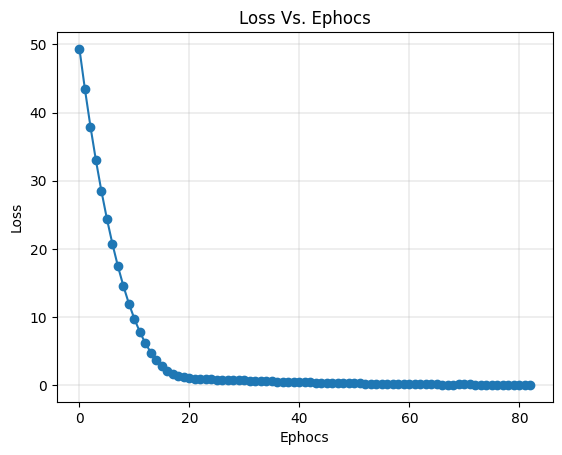

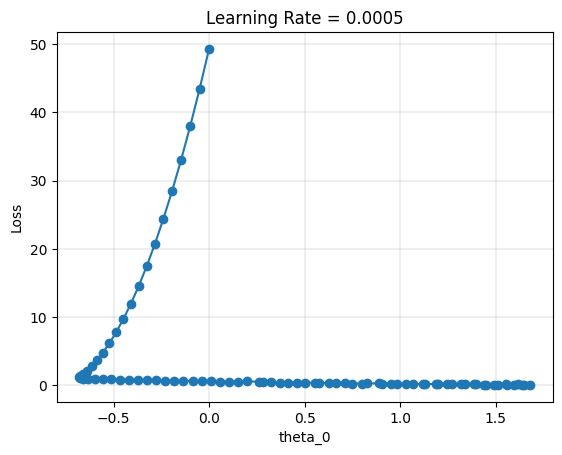

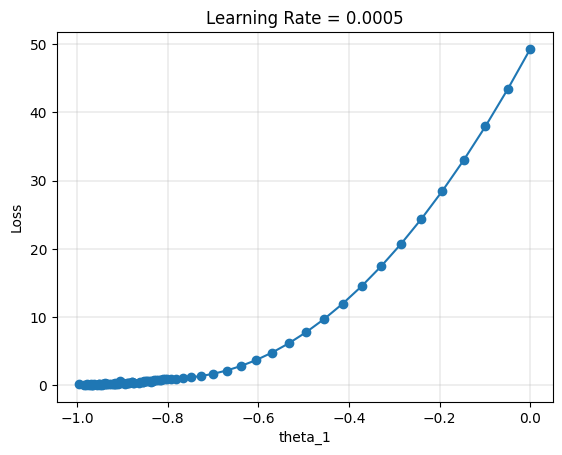

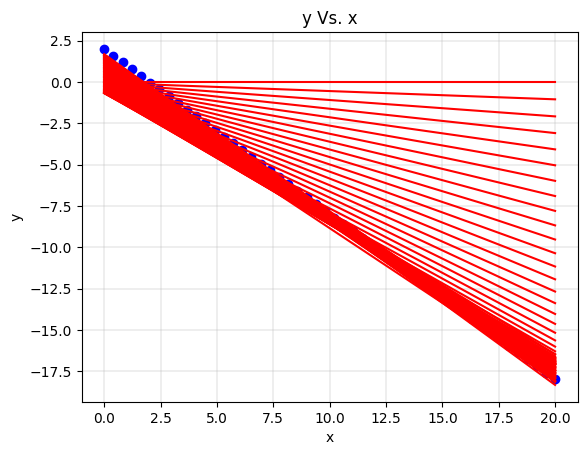

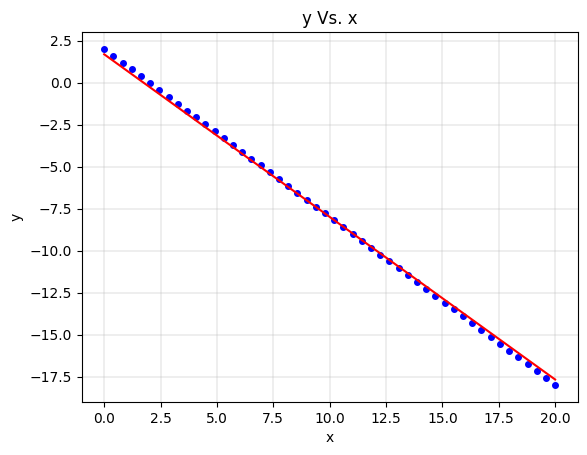

In [ ]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.005, beta1 = 0.5, beta2 = 0.8, epsilon =  1e-08, and max. iterations = 500.

In [ ]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adam_single_var(X, y, 0.005, 1e-08, 0.5, 0.8, 500)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

m_t_0:  4.0
m_t_1:  57.34693877551021

m_t_0


Gradient Vector:
 [[-0.6570241379915072], [0.0587190045067112]]

Gradient Vector Norm:
 0.6596428119776204

m_t_0:  -0.6571441326053873
m_t_1:  0.07525809690265431

m_t_0_corrected:  -0.6571441326053873
m_t_1_corrected:  0.07525809690265431

V_t_0:  0.40736491792099405
V_t_1:  1.175023230522783

V_t_0_corrected:  0.40736491792099405
V_t_1_corrected:  1.175023230522783

theta_0_new:  -0.5625764807541522
theta_1_new:  -0.8092771016707017

****************** Iteration 183 ********************

h(x):
 [ -0.56257648  -0.89289367  -1.22321085  -1.55352803  -1.88384522
  -2.2141624   -2.54447959  -2.87479677  -3.20511396  -3.53543114
  -3.86574832  -4.19606551  -4.52638269  -4.85669988  -5.18701706
  -5.51733425  -5.84765143  -6.17796861  -6.5082858   -6.83860298
  -7.16892017  -7.49923735  -7.82955454  -8.15987172  -8.49018891
  -8.82050609  -9.15082327  -9.48114046  -9.81145764 -10.14177483
 -10.47209201 -10.8024092  -11.13272638 -11.46304356 -11.79336075
 -12.12367793 -12.45399512 -12.784

In [ ]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9926188101249642


<Figure size 640x480 with 0 Axes>

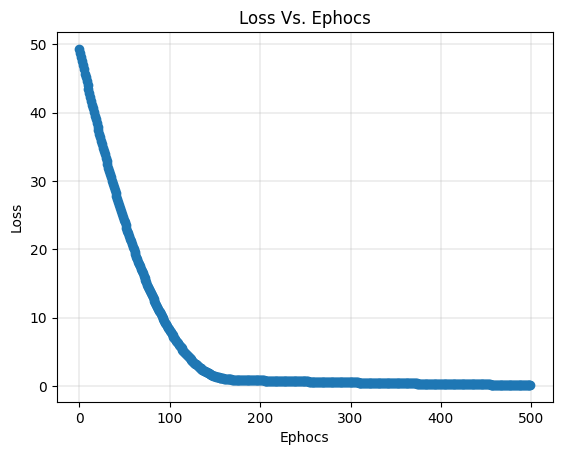

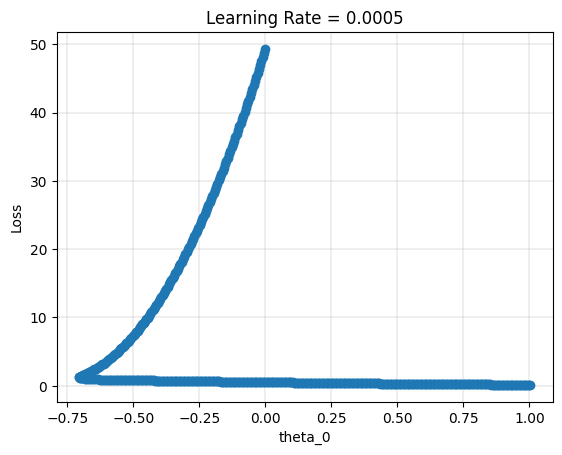

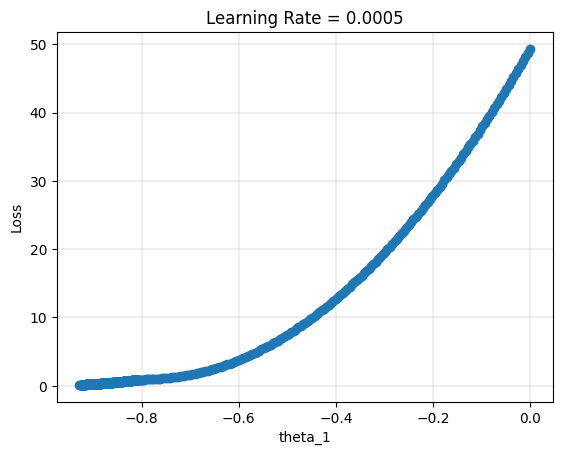

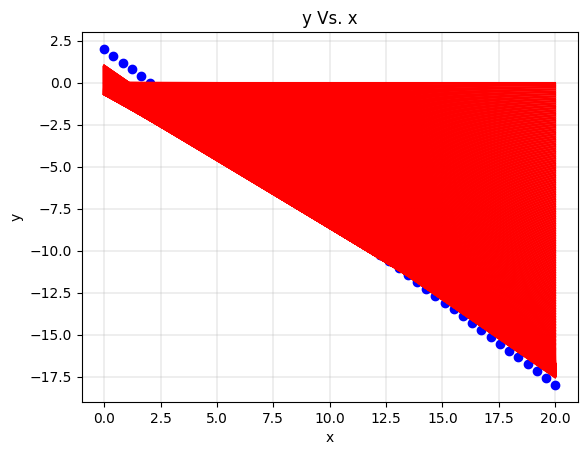

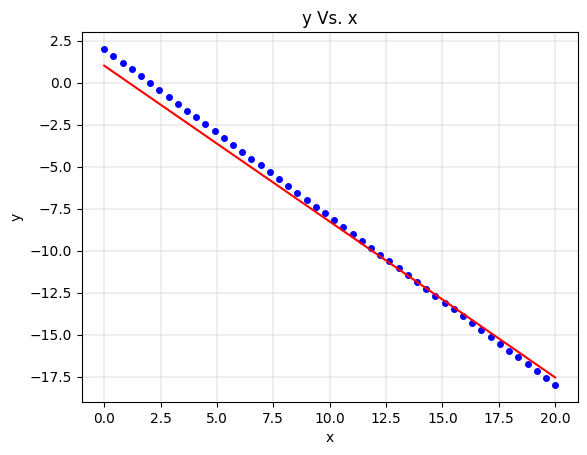

In [ ]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.0005, beta1 = 0.8, beta2 = 0.8, epsilon =  1e-08, and max. iterations = 5000.

In [ ]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adam_single_var(X, y, 0.0005, 1e-08, 0.8, 0.8, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

m_t_0:  1.5999999999999996
m_t_1:  22.938775


Gradient Vector:
 [[4.441523992148342], [67.88572196653605]]

Gradient Vector Norm:
 68.03086345395496

m_t_0:  4.46352373928266
m_t_1:  68.17510641978026

m_t_0_corrected:  4.46352373928266
m_t_1_corrected:  68.17510641978026

V_t_0:  19.923649157350297
V_t_1:  4647.949814570762

V_t_0_corrected:  19.923649157350297
V_t_1_corrected:  4647.949814570762

theta_0_new:  -0.3239972955978677
theta_1_new:  -0.3239978648356277

****************** Iteration 648 ********************

h(x):
 [-0.3239973  -0.45624132 -0.58848535 -0.72072937 -0.8529734  -0.98521743
 -1.11746145 -1.24970548 -1.38194951 -1.51419353 -1.64643756 -1.77868159
 -1.91092561 -2.04316964 -2.17541367 -2.30765769 -2.43990172 -2.57214575
 -2.70438977 -2.8366338  -2.96887782 -3.10112185 -3.23336588 -3.3656099
 -3.49785393 -3.63009796 -3.76234198 -3.89458601 -4.02683004 -4.15907406
 -4.29131809 -4.42356212 -4.55580614 -4.68805017 -4.8202942  -4.95253822
 -5.08478225 -5.21702627 -5.3492703  -5.48151433 -5.61375835 -5.74600238
 -


Gradient Vector:
 [[1.9555805523958214], [35.18564065575477]]

Gradient Vector Norm:
 35.239943298093024

m_t_0:  1.977579586677546
m_t_1:  35.475015925472896

m_t_0_corrected:  1.977579586677546
m_t_1_corrected:  35.475015925472896

V_t_0:  3.911425969410736
V_t_1:  1258.5814276189371

V_t_0_corrected:  3.911425969410736
V_t_1_corrected:  1258.5814276189371

theta_0_new:  -0.549989535158445
theta_1_new:  -0.5499929665852529

****************** Iteration 1100 ********************

h(x):
 [ -0.54998954  -0.77447646  -0.99896339  -1.22345031  -1.44793724
  -1.67242416  -1.89691109  -2.12139801  -2.34588494  -2.57037186
  -2.79485879  -3.01934571  -3.24383264  -3.46831956  -3.69280649
  -3.91729341  -4.14178034  -4.36626726  -4.59075419  -4.81524111
  -5.03972804  -5.26421496  -5.48870189  -5.71318881  -5.93767574
  -6.16216266  -6.38664959  -6.61113651  -6.83562344  -7.06011036
  -7.28459729  -7.50908421  -7.73357114  -7.95805806  -8.18254499
  -8.40703191  -8.63151884  -8.85600577  -9.


Gradient Vector:
 [[1.1416342032898794], [24.47898274909087]]

Gradient Vector Norm:
 24.505589670204014

m_t_0:  1.1636321186225829
m_t_1:  24.768343905532536

m_t_0_corrected:  1.1636321186225829
m_t_1_corrected:  24.768343905532536

V_t_0:  1.3546445956786477
V_t_1:  613.5755226371509

V_t_0_corrected:  1.3546445956786477
V_t_1_corrected:  613.5755226371509

theta_0_new:  -0.6239797738458688
theta_1_new:  -0.623988548474868

****************** Iteration 1248 ********************

h(x):
 [ -0.62397977  -0.87866898  -1.13335818  -1.38804738  -1.64273659
  -1.89742579  -2.15211499  -2.4068042   -2.6614934   -2.9161826
  -3.17087181  -3.42556101  -3.68025022  -3.93493942  -4.18962862
  -4.44431783  -4.69900703  -4.95369623  -5.20838544  -5.46307464
  -5.71776384  -5.97245305  -6.22714225  -6.48183145  -6.73652066
  -6.99120986  -7.24589906  -7.50058827  -7.75527747  -8.00996667
  -8.26465588  -8.51934508  -8.77403428  -9.02872349  -9.28341269
  -9.53810189  -9.7927911  -10.0474803  -10


Gradient Vector:
 [[-0.2086995733527163], [6.588140005544298]]

Gradient Vector Norm:
 6.5914447767216275

m_t_0:  -0.19069891917893844
m_t_1:  6.837481209104775

m_t_0_corrected:  -0.19069891917893844
m_t_1_corrected:  6.837481209104775

V_t_0:  0.03677163965842775
V_t_1:  46.828938575557146

V_t_0_corrected:  0.03677163965842775
V_t_1_corrected:  46.828938575557146

theta_0_new:  -0.7086826395861225
theta_1_new:  -0.7504515544161946

****************** Iteration 1501 ********************

h(x):
 [ -0.70868264  -1.0149894   -1.32129615  -1.62760291  -1.93390967
  -2.24021642  -2.54652318  -2.85282994  -3.15913669  -3.46544345
  -3.77175021  -4.07805697  -4.38436372  -4.69067048  -4.99697724
  -5.30328399  -5.60959075  -5.91589751  -6.22220426  -6.52851102
  -6.83481778  -7.14112453  -7.44743129  -7.75373805  -8.06004481
  -8.36635156  -8.67265832  -8.97896508  -9.28527183  -9.59157859
  -9.89788535 -10.2041921  -10.51049886 -10.81680562 -11.12311237
 -11.42941913 -11.73572589 -12.042

In [ ]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9467806664066584


<Figure size 640x480 with 0 Axes>

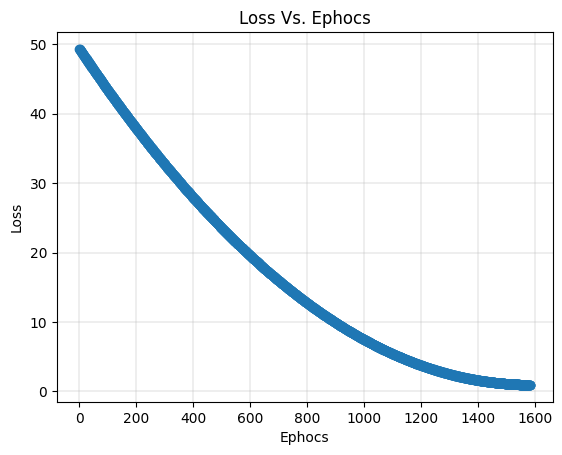

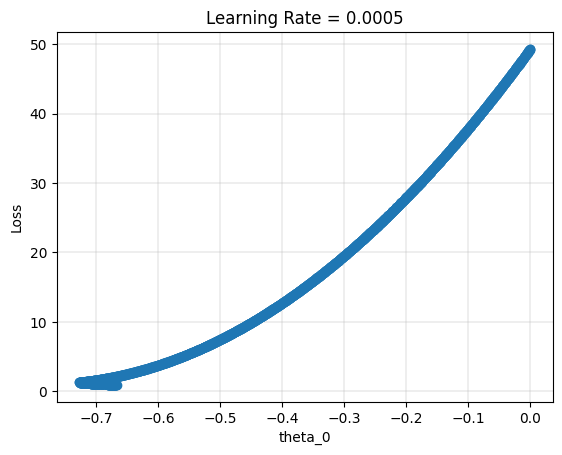

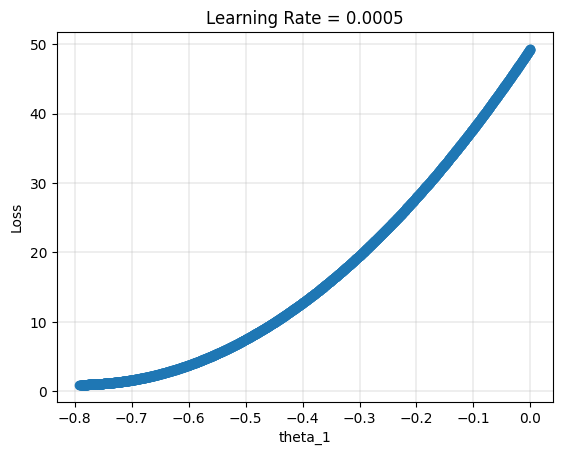

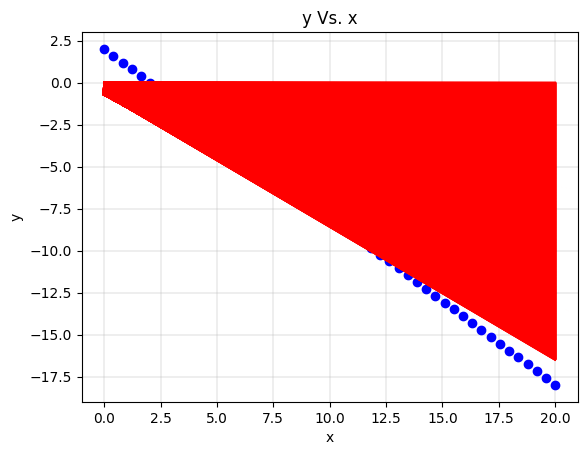

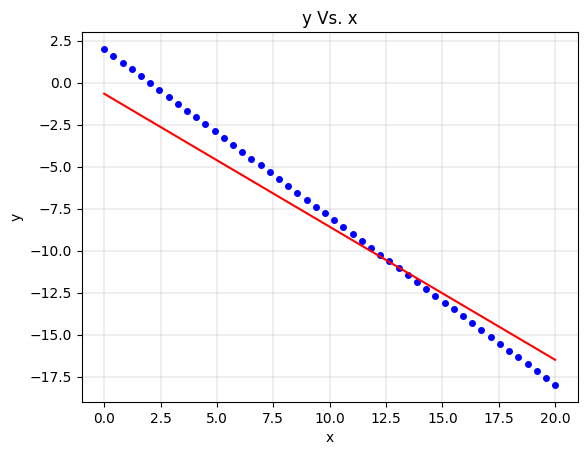

In [ ]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

### Play with the parameters and see the results

##### The following results uses alpha = 0.001, beta1 = 0.9, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

In [ ]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adam_single_var(X, y, 0.001, 1e-08, 0.9, 0.99, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

m_t_0:  0.7999999999999998
m_t_1:  11.469387


Gradient Vector:
 [[2.9442313874363153], [48.16681340219285]]

Gradient Vector Norm:
 48.25671364467777

m_t_0:  3.024293111554404
m_t_1:  49.22097864991346

m_t_0_corrected:  3.024293111554404
m_t_1_corrected:  49.22097864991346

V_t_0:  15.329498464396186
V_t_1:  3687.436834271313

V_t_0_corrected:  15.418396885816488
V_t_1_corrected:  3708.820920281377

theta_0_new:  -0.4536004425115597
theta_1_new:  -0.46110206219942784

****************** Iteration 513 ********************

h(x):
 [-0.45360044 -0.64180537 -0.83001029 -1.01821521 -1.20642014 -1.39462506
 -1.58282998 -1.77103491 -1.95923983 -2.14744475 -2.33564968 -2.5238546
 -2.71205952 -2.90026445 -3.08846937 -3.27667429 -3.46487922 -3.65308414
 -3.84128906 -4.02949399 -4.21769891 -4.40590383 -4.59410876 -4.78231368
 -4.9705186  -5.15872353 -5.34692845 -5.53513337 -5.7233383  -5.91154322
 -6.09974814 -6.28795307 -6.47615799 -6.66436291 -6.85256784 -7.04077276
 -7.22897768 -7.41718261 -7.60538753 -7.79359245 -7.98179738 -8.1700023


Gradient Vector:
 [[1.190790029488951], [25.057390926976634]]

Gradient Vector Norm:
 25.085669633511106

m_t_0:  1.2592891173166212
m_t_1:  25.96147281015034

m_t_0_corrected:  1.2592891173166212
m_t_1_corrected:  25.96147281015034

V_t_0:  4.702497536631647
V_t_1:  1396.9581621580792

V_t_0_corrected:  4.705719659772914
V_t_1_corrected:  1397.915349522157

theta_0_new:  -0.5999377839802646
theta_1_new:  -0.6216796367237597

****************** Iteration 725 ********************

h(x):
 [ -0.59993778  -0.85368457  -1.10743136  -1.36117816  -1.61492495
  -1.86867174  -2.12241853  -2.37616532  -2.62991211  -2.8836589
  -3.13740569  -3.39115248  -3.64489927  -3.89864606  -4.15239285
  -4.40613964  -4.65988643  -4.91363322  -5.16738001  -5.4211268
  -5.67487359  -5.92862038  -6.18236717  -6.43611397  -6.68986076
  -6.94360755  -7.19735434  -7.45110113  -7.70484792  -7.95859471
  -8.2123415   -8.46608829  -8.71983508  -8.97358187  -9.22732866
  -9.48107545  -9.73482224  -9.98856903 -10.242


Gradient Vector:
 [[-0.4840072272146462], [2.546827497574728]]

Gradient Vector Norm:
 2.5924107117505053

m_t_0:  -0.46595976093174035
m_t_1:  2.8139919638288746

m_t_0_corrected:  -0.46595976093174035
m_t_1_corrected:  2.8139919638288746

V_t_0:  0.32113004536344947
V_t_1:  115.22945073994404

V_t_0_corrected:  0.32113818400382077
V_t_1_corrected:  115.23237108661759

theta_0_new:  -0.6123502077023878
theta_1_new:  -0.7873456186189252

****************** Iteration 1053 ********************

h(x):
 [ -0.61235021  -0.93371577  -1.25508132  -1.57644688  -1.89781244
  -2.219178    -2.54054356  -2.86190912  -3.18327468  -3.50464024
  -3.82600579  -4.14737135  -4.46873691  -4.79010247  -5.11146803
  -5.43283359  -5.75419915  -6.0755647   -6.39693026  -6.71829582
  -7.03966138  -7.36102694  -7.6823925   -8.00375806  -8.32512361
  -8.64648917  -8.96785473  -9.28922029  -9.61058585  -9.93195141
 -10.25331697 -10.57468252 -10.89604808 -11.21741364 -11.5387792
 -11.86014476 -12.18151032 -12.50

In [ ]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9485667803280174


<Figure size 640x480 with 0 Axes>

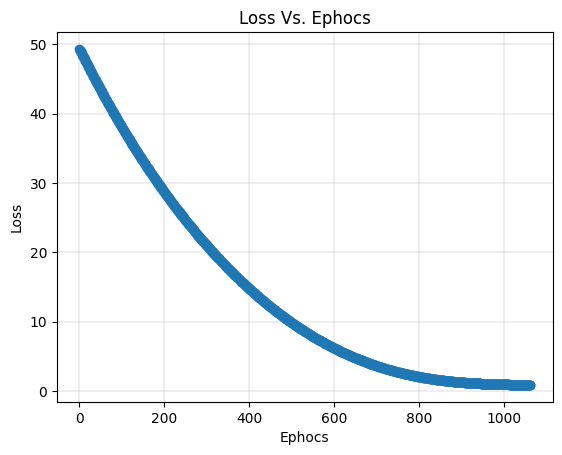

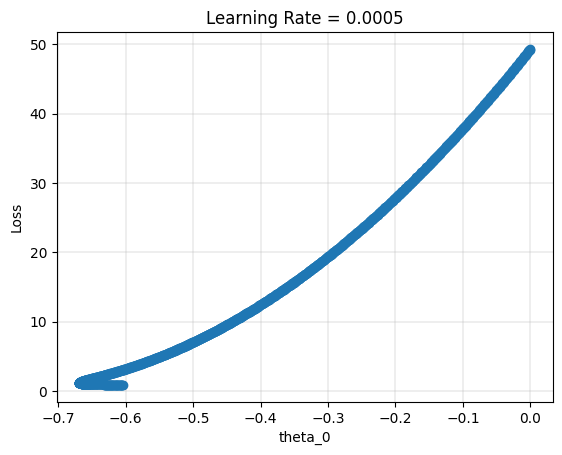

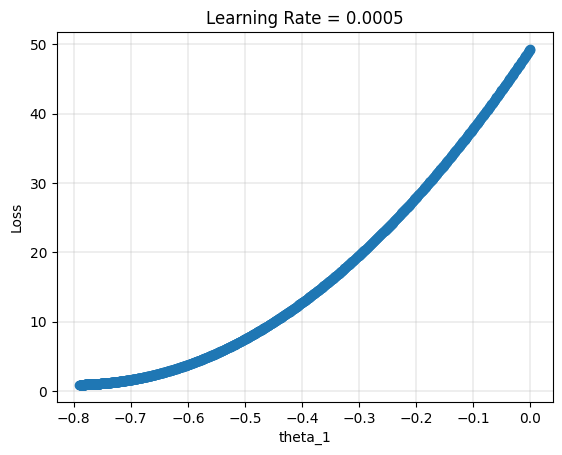

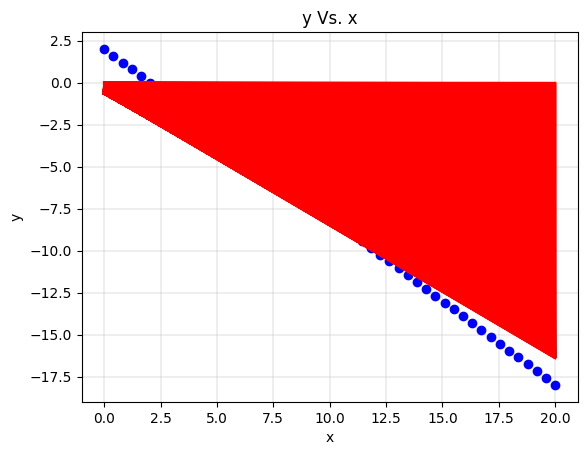

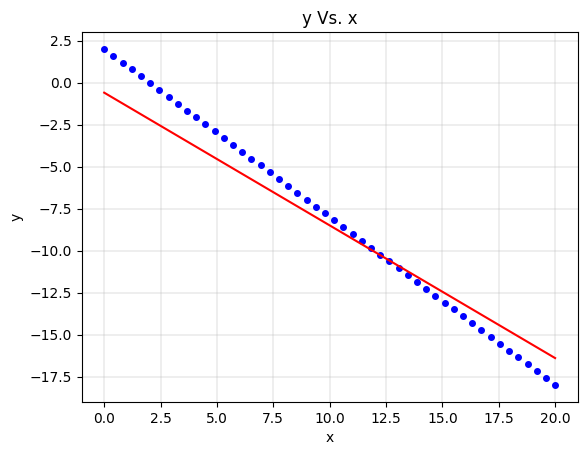

In [ ]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.001, beta1 = 0.9, beta2 = 0.5, epsilon =  1e-08, and max. iterations = 5000.

In [ ]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adam_single_var(X, y, 0.001, 1e-08, 0.9, 0.5, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

m_t_0:  0.7999999999999998
m_t_1:  11.469387


Gradient Vector:
 [[4.793358890395197], [72.5150514298744]]

Gradient Vector Norm:
 72.67330303027006

m_t_0:  4.893950033517852
m_t_1:  73.83816026402725

m_t_0_corrected:  4.893950033518144
m_t_1_corrected:  73.83816026403166

V_t_0:  23.08384070932722
V_t_1:  5279.8241773953905

V_t_0_corrected:  23.08384070932722
V_t_1_corrected:  5279.8241773953905

theta_0_new:  -0.2929047948835894
theta_1_new:  -0.2924916730558452

****************** Iteration 289 ********************

h(x):
 [-0.29290479 -0.41228915 -0.53167351 -0.65105786 -0.77044222 -0.88982658
 -1.00921093 -1.12859529 -1.24797965 -1.367364   -1.48674836 -1.60613271
 -1.72551707 -1.84490143 -1.96428578 -2.08367014 -2.2030545  -2.32243885
 -2.44182321 -2.56120757 -2.68059192 -2.79997628 -2.91936063 -3.03874499
 -3.15812935 -3.2775137  -3.39689806 -3.51628242 -3.63566677 -3.75505113
 -3.87443549 -3.99381984 -4.1132042  -4.23258855 -4.35197291 -4.47135727
 -4.59074162 -4.71012598 -4.82951034 -4.94889469 -5.06827905 -5.18766341


In [ ]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.944245878919177


<Figure size 640x480 with 0 Axes>

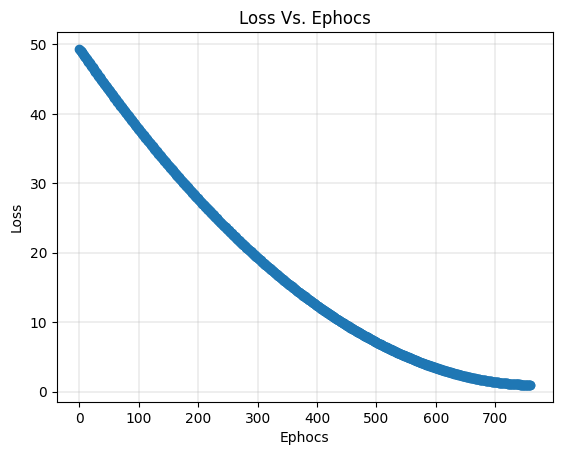

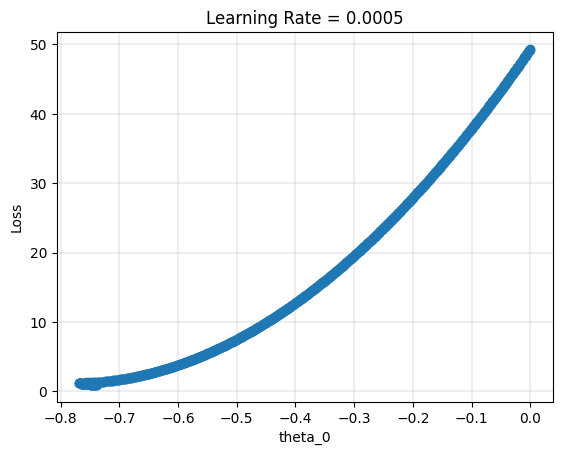

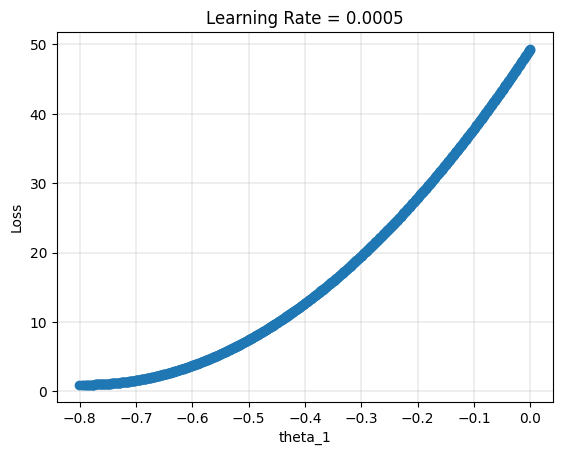

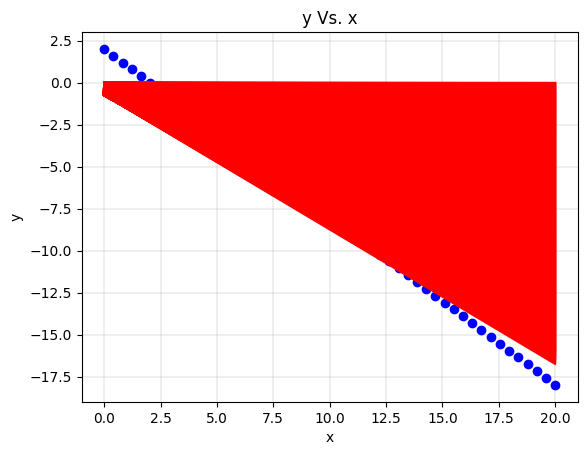

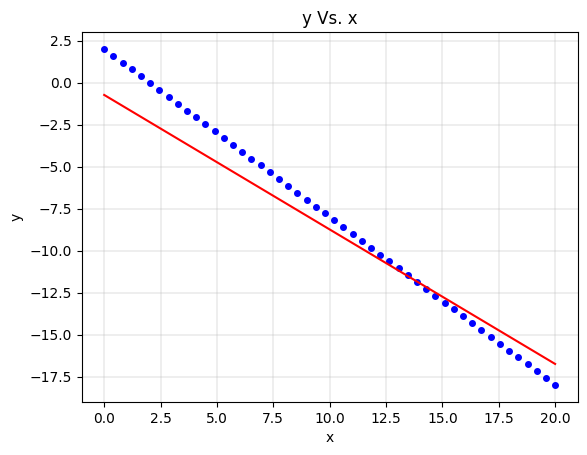

In [ ]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.001, beta1 = 0.5, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

In [ ]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adam_single_var(X, y, 0.001, 1e-08, 0.5, 0.99, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

m_t_0:  4.0
m_t_1:  57.34693877551021

m_t_0


Gradient Vector:
 [[4.778762343032035], [72.31318737705527]]

Gradient Vector Norm:
 72.47091580875936

m_t_0:  4.788253153813054
m_t_1:  72.43808592598853

m_t_0_corrected:  4.788253153813054
m_t_1_corrected:  72.43808592598853

V_t_0:  30.743749416616065
V_t_1:  6744.898262620968

V_t_0_corrected:  32.05563596653327
V_t_1_corrected:  7032.71420827495

theta_0_new:  -0.29121651125117376
theta_1_new:  -0.2939504708900973

****************** Iteration 318 ********************

h(x):
 [-0.29121651 -0.4111963  -0.53117608 -0.65115586 -0.77113565 -0.89111543
 -1.01109522 -1.131075   -1.25105478 -1.37103457 -1.49101435 -1.61099414
 -1.73097392 -1.8509537  -1.97093349 -2.09091327 -2.21089306 -2.33087284
 -2.45085262 -2.57083241 -2.69081219 -2.81079198 -2.93077176 -3.05075154
 -3.17073133 -3.29071111 -3.4106909  -3.53067068 -3.65065046 -3.77063025
 -3.89061003 -4.01058982 -4.1305696  -4.25054938 -4.37052917 -4.49050895
 -4.61048874 -4.73046852 -4.8504483  -4.97042809 -5.09040787 -5.21038766



Gradient Vector:
 [[1.6754096193542265], [31.446084442368548]]

Gradient Vector Norm:
 31.4906847202343

m_t_0:  1.6832700718385003
m_t_1:  31.54974116563394

m_t_0_corrected:  1.6832700718385003
m_t_1_corrected:  31.54974116563394

V_t_0:  6.9651563718415
V_t_1:  1913.1664405650217

V_t_0_corrected:  6.973290078417214
V_t_1_corrected:  1915.400580565233

theta_0_new:  -0.5599773682934006
theta_1_new:  -0.5772459295997185

****************** Iteration 672 ********************

h(x):
 [ -0.55997737  -0.79558795  -1.03119854  -1.26680912  -1.5024197
  -1.73803029  -1.97364087  -2.20925145  -2.44486204  -2.68047262
  -2.9160832   -3.15169379  -3.38730437  -3.62291495  -3.85852554
  -4.09413612  -4.3297467   -4.56535729  -4.80096787  -5.03657845
  -5.27218904  -5.50779962  -5.74341021  -5.97902079  -6.21463137
  -6.45024196  -6.68585254  -6.92146312  -7.15707371  -7.39268429
  -7.62829487  -7.86390546  -8.09951604  -8.33512662  -8.57073721
  -8.80634779  -9.04195837  -9.27756896  -9.51317


Gradient Vector:
 [[0.2297165552970962], [12.315356567260329]]

Gradient Vector Norm:
 12.317498815690612

m_t_0:  0.23527423939510378
m_t_1:  12.389487430789188

m_t_0_corrected:  0.23527423939510378
m_t_1_corrected:  12.389487430789188

V_t_0:  1.3530216128973476
V_t_1:  541.6595950587667

V_t_0_corrected:  1.3532109528804153
V_t_1_corrected:  541.7353941573024

theta_0_new:  -0.6580819296732724
theta_1_new:  -0.7117726806518797

****************** Iteration 883 ********************

h(x):
 [ -0.65808193  -0.94860139  -1.23912085  -1.52964031  -1.82015978
  -2.11067924  -2.4011987   -2.69171816  -2.98223762  -3.27275708
  -3.56327654  -3.85379601  -4.14431547  -4.43483493  -4.72535439
  -5.01587385  -5.30639331  -5.59691278  -5.88743224  -6.1779517
  -6.46847116  -6.75899062  -7.04951008  -7.34002954  -7.63054901
  -7.92106847  -8.21158793  -8.50210739  -8.79262685  -9.08314631
  -9.37366577  -9.66418524  -9.9547047  -10.24522416 -10.53574362
 -10.82626308 -11.11678254 -11.407302   


Gradient Vector:
 [[-0.45558108368670414], [2.9080136566154478]]

Gradient Vector Norm:
 2.9434839138128646

m_t_0:  -0.45366118457573723
m_t_1:  2.936701382466684

m_t_0_corrected:  -0.45366118457573723
m_t_1_corrected:  2.936701382466684

V_t_0:  0.3025405667526634
V_t_1:  117.64760443337633

V_t_0_corrected:  0.30254736310082214
V_t_1_corrected:  117.65024729905335

theta_0_new:  -0.6060939578715342
theta_1_new:  -0.7851369820082715

****************** Iteration 1065 ********************

h(x):
 [ -0.60609396  -0.92655803  -1.24702211  -1.56748618  -1.88795026
  -2.20841433  -2.5288784   -2.84934248  -3.16980655  -3.49027063
  -3.8107347   -4.13119878  -4.45166285  -4.77212692  -5.092591
  -5.41305507  -5.73351915  -6.05398322  -6.3744473   -6.69491137
  -7.01537544  -7.33583952  -7.65630359  -7.97676767  -8.29723174
  -8.61769582  -8.93815989  -9.25862396  -9.57908804  -9.89955211
 -10.22001619 -10.54048026 -10.86094434 -11.18140841 -11.50187248
 -11.82233656 -12.14280063 -12.4632

In [ ]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.949344733641701


<Figure size 640x480 with 0 Axes>

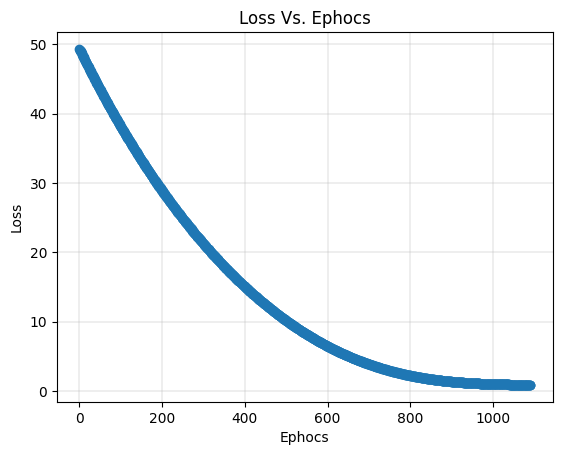

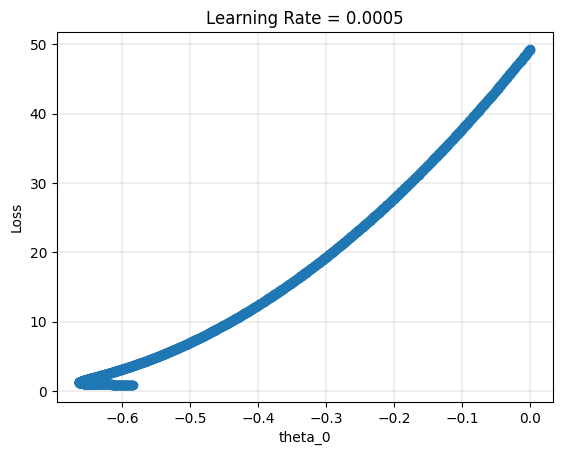

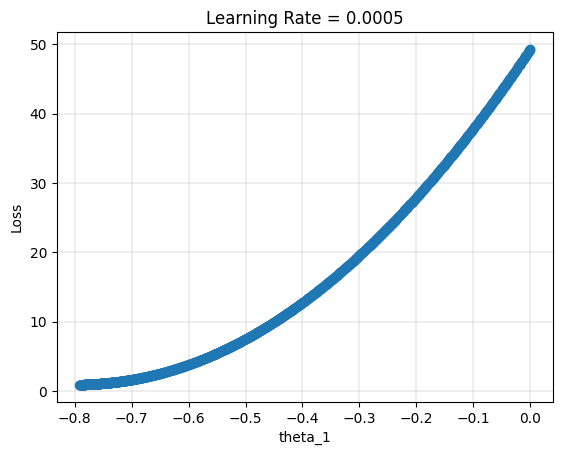

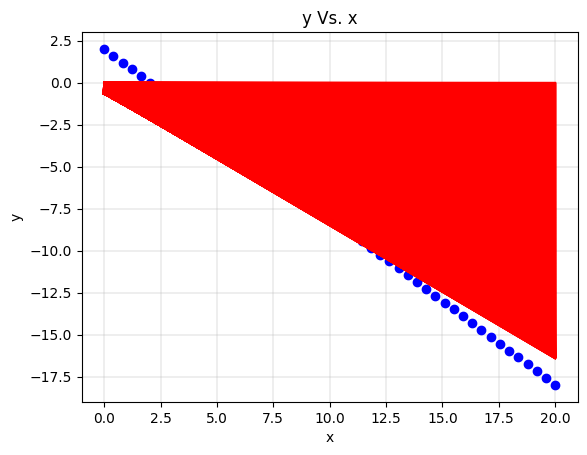

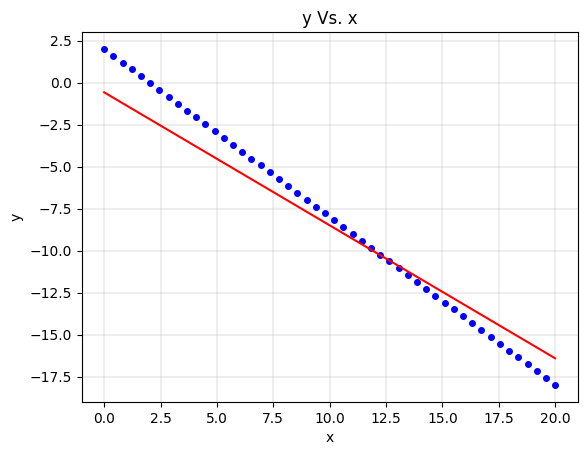

In [ ]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.001, beta1 = 0.5, beta2 = 0.5, epsilon =  1e-08, and max. iterations = 5000.

In [ ]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adam_single_var(X, y, 0.001, 1e-08, 0.5, 0.5, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

m_t_0:  4.0
m_t_1:  57.34693877551021

m_t_0


Gradient Vector:
 [[1.9280329087921075], [34.82328556391687]]

Gradient Vector Norm:
 34.8766186486518

m_t_0:  1.9390327088874468
m_t_1:  34.96797685806464

m_t_0_corrected:  1.9390327088874468
m_t_1_corrected:  34.96797685806464

V_t_0:  3.7600898374145513
V_t_1:  1222.801276699925

V_t_0_corrected:  3.7600898374145513
V_t_1_corrected:  1222.801276699925

theta_0_new:  -0.5529956903397293
theta_1_new:  -0.5529971197469271

****************** Iteration 553 ********************

h(x):
 [ -0.55299569  -0.7787088   -1.00442191  -1.23013502  -1.45584813
  -1.68156124  -1.90727435  -2.13298746  -2.35870057  -2.58441368
  -2.81012679  -3.0358399   -3.26155301  -3.48726612  -3.71297923
  -3.93869234  -4.16440545  -4.39011856  -4.61583167  -4.84154478
  -5.06725789  -5.292971    -5.51868411  -5.74439722  -5.97011033
  -6.19582344  -6.42153655  -6.64724966  -6.87296277  -7.09867588
  -7.32438899  -7.5501021   -7.77581521  -8.00152832  -8.22724143
  -8.45295454  -8.67866765  -8.90438076  -9.13

In [ ]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9475845101116701


<Figure size 640x480 with 0 Axes>

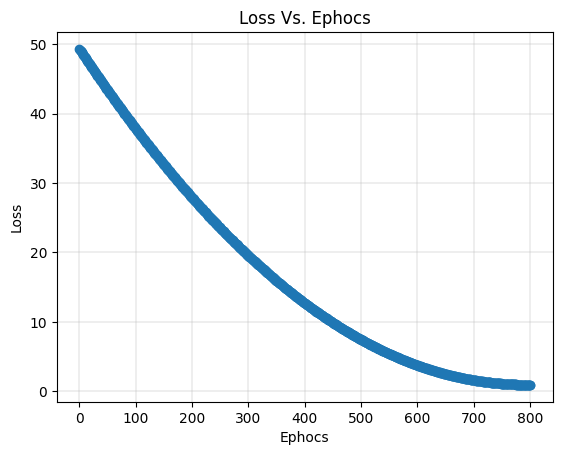

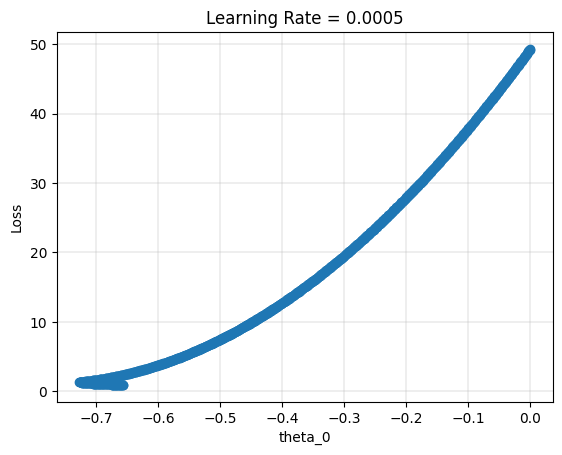

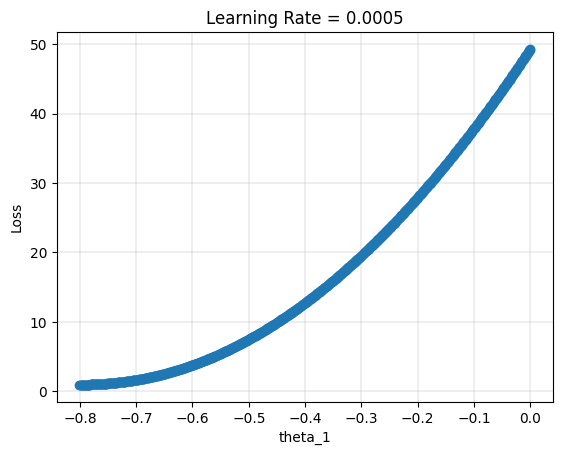

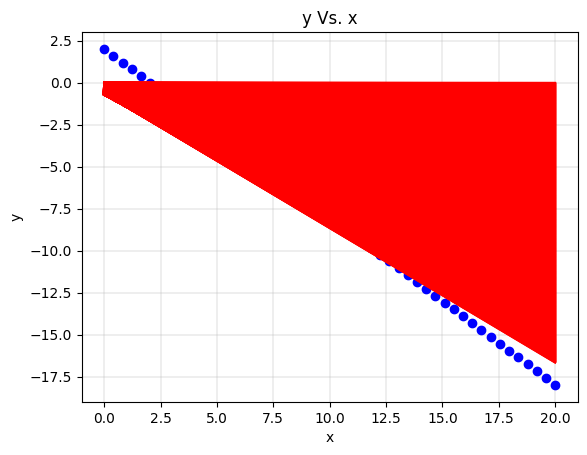

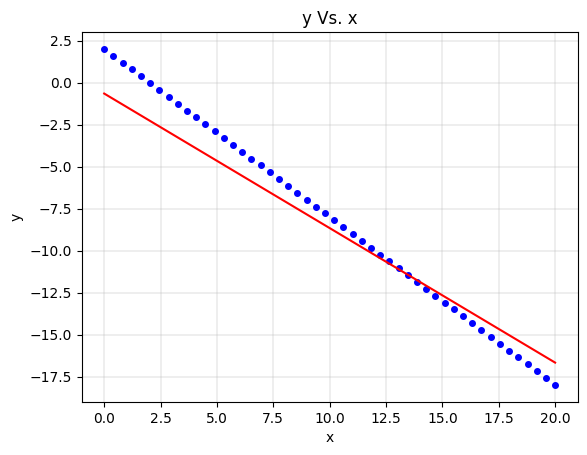

In [ ]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.01, beta1 = 0.9, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

In [ ]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adam_single_var(X, y, 0.01, 1e-08, 0.9, 0.99, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

m_t_0:  0.7999999999999998
m_t_1:  11.469387


Gradient Vector:
 [[-0.42869011160552417], [0.4149770934716194]]

Gradient Vector Norm:
 0.5966416008748551

m_t_0:  -0.43900712991789603
m_t_1:  0.43003815572205245

m_t_0_corrected:  -0.43900712991789603
m_t_1_corrected:  0.43003815572205245

V_t_0:  0.7512589295441047
V_t_1:  122.4838170668951

V_t_0_corrected:  0.7695625203686333
V_t_1_corrected:  125.46799946001398

theta_0_new:  0.22106701210112897
theta_1_new:  -0.8648591949308875

****************** Iteration 372 ********************

h(x):
 [  0.22106701  -0.13193674  -0.48494049  -0.83794425  -1.190948
  -1.54395175  -1.89695551  -2.24995926  -2.60296301  -2.95596677
  -3.30897052  -3.66197427  -4.01497802  -4.36798178  -4.72098553
  -5.07398928  -5.42699304  -5.77999679  -6.13300054  -6.4860043
  -6.83900805  -7.1920118   -7.54501555  -7.89801931  -8.25102306
  -8.60402681  -8.95703057  -9.31003432  -9.66303807 -10.01604183
 -10.36904558 -10.72204933 -11.07505308 -11.42805684 -11.78106059
 -12.13406434 -12.4870681  -12.8400

In [ ]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9952892444628807


<Figure size 640x480 with 0 Axes>

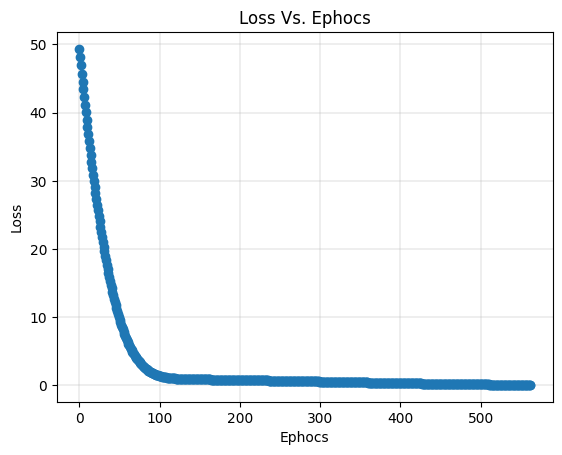

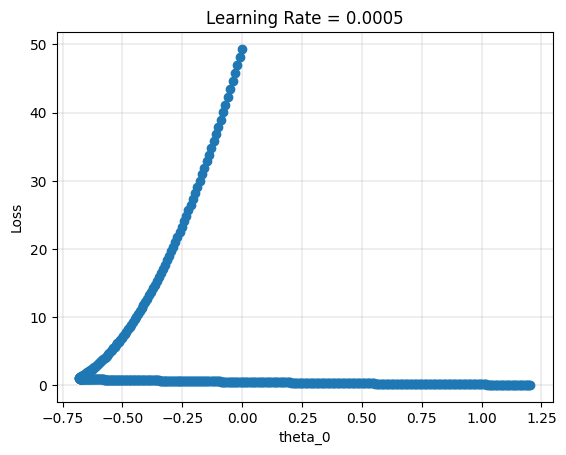

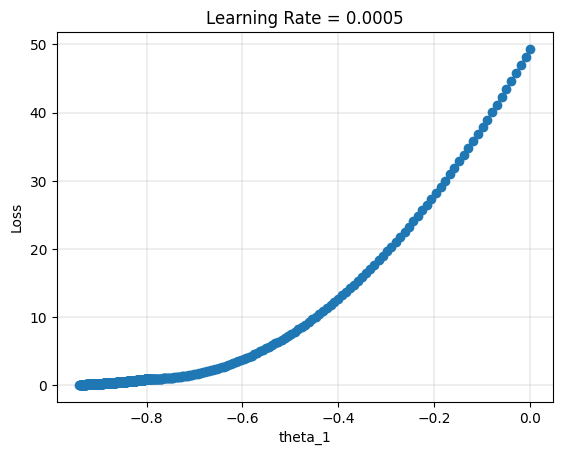

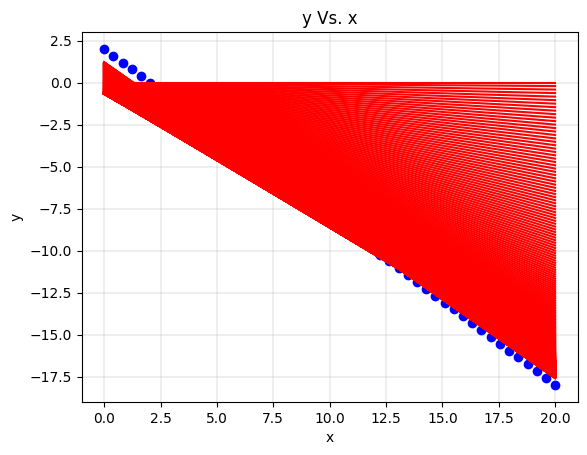

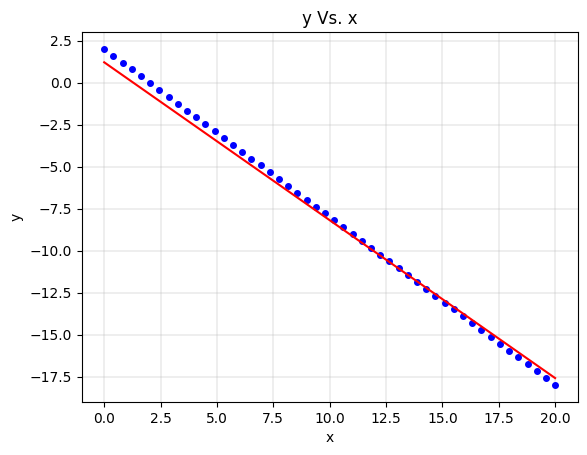

In [ ]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

## Congratulations 
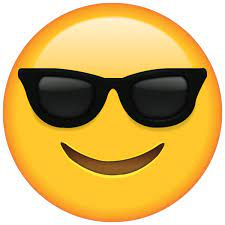